In [579]:
import os

import pandas as pd

import matplotlib as mpl
import matplotlib.pyplot as plt

import seaborn as sns

import PIL 
from PIL import Image

import cv2

In [581]:
project_path = os.getcwd()
image_path = r'F:\Codenrock\Kryptonite\data\train\images'
#project_path

In [583]:
coords_df = pd.read_csv('points_df')
coords_df

,folder,image,left_eye_x,left_eye_y,right_eye_x,right_eye_y,nose_x,nose_y,left_mouth_x,left_mouth_y,right_mouth_x,right_mouth_y
0,0,0.jpg,70.293776,90.674323,151.365816,94.889114,117.071802,131.807275,74.369801,157.591915,146.275379,160.924941
1,0,1.jpg,69.580295,90.073405,156.717269,100.265060,129.728629,124.721979,76.691813,157.875909,140.767685,165.875864
2,0,2.jpg,82.465339,104.280702,142.471063,104.811607,114.939235,136.771507,85.158050,159.949795,136.963997,160.577387
3,0,3.jpg,80.448859,102.413674,140.424275,104.375992,99.766897,126.291629,80.780504,162.513932,129.175480,164.378685
4,0,4.jpg,71.584100,91.523647,151.622520,95.589734,121.725819,131.650176,73.129187,152.414759,145.182651,155.334909
...,...,...,...,...,...,...,...,...,...,...,...,...
97728,9999,4.jpg,83.923056,105.820967,138.782989,108.440058,117.127845,125.220872,92.171281,163.416848,132.105251,165.387115
97729,9999,5.jpg,74.329556,90.746301,154.508275,94.955056,113.437548,124.841995,76.014400,163.639840,147.937645,166.875557
97730,9999,6.jpg,83.271810,104.747291,138.957000,105.482776,109.451029,135.194591,87.223640,164.572893,132.917841,165.264867
97731,9999,7.jpg,71.405141,93.835775,153.594045,92.857850,115.630346,137.028752,73.463271,152.329632,155.821337,150.818192


In [228]:
def show_points(path, folder, name, df):
    img = Image.open(os.path.join(path, folder, name))
    coord = np.array(df.loc[(df['folder'] == int(folder)) & (df['image'] == name)])[0][2::]
    plt.figure(figsize = (6, 6))
    plt.imshow(img)
    plt.scatter(coord[::2], coord[1::2], s = 50, marker ='.', c='w')
    plt.axis('off');

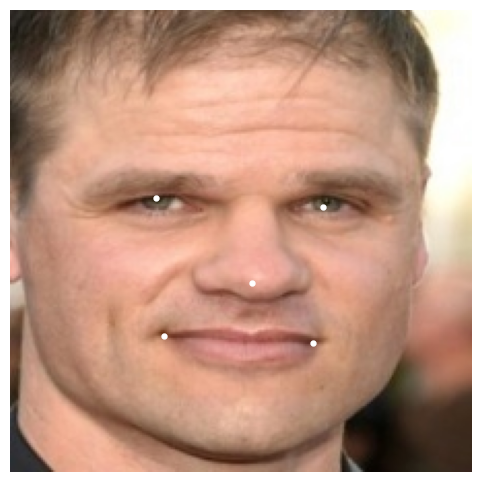

In [230]:
show_points(project_path, '000000', '0.jpg', coords_df)

In [512]:
def crop_face(path, folder, name, df, output_path, show = False):
    img = Image.open(os.path.join(path, folder, name))
    coord = np.array(df.loc[(df['folder'] == int(folder)) & (df['image'] == name)])[0][2::]
    plt.figure(figsize = (6, 6))
    
    x = coord[0] - (coord[2] - coord[0]) / 1.7
    y = coord[1] - (coord[5] - coord[1]) * 1.7
    width = ((coord[2] - coord[0]) / 1.7 + coord[2]) - x
    height = (coord[7] - coord[5]) * 1.7 + coord[7] - y # you may change the height

    if x < 0:
        left = 0
    else:
        left = x

    if y < 0:
        up = 0
    else:
        up = y
 
    if x + width > 224:
        right = 224
    else:
        right = x + width
        
    if y + height > 224:
        bottom = 224
    else:
        bottom = y + height
        
    cropped = img.crop((left, up, right, bottom))

    cropped.save(os.path.join(output_path, name))
    coords_new = [coord[0] - x, coord[1] - y, coord[2] - x, coord[3] - y, coord[4] - x, coord[5] - y, coord[6] - x, coord[7] - y, coord[8] - x, coord[9] - y]

    if show == True:
        plt.imshow(cropped)
        plt.axis('off');

    return coords_new

In [545]:
def crop_resize_face(path, folder, name, df, output_path, show = False):
    img = Image.open(os.path.join(path, folder, name))
    coord = np.array(df.loc[(df['folder'] == int(folder)) & (df['image'] == name)])[0][2::]
    plt.figure(figsize = (6, 6))
    
    x = coord[0] - (coord[2] - coord[0]) / 1.7
    y = coord[1] - (coord[5] - coord[1]) * 1.7
    width = ((coord[2] - coord[0]) / 1.7 + coord[2]) - x
    height = (coord[7] - coord[5]) * 1.7 + coord[7] - y # you may change the height

    if x < 0:
        left = 0
    else:
        left = x

    if y < 0:
        up = 0
    else:
        up = y
 
    if x + width > 224:
        right = 224
    else:
        right = x + width
        
    if y + height > 224:
        bottom = 224
    else:
        bottom = y + height
        
    cropped = img.crop((left, up, right, bottom))

    img_w = right - left
    img_h = bottom - up
    
    mltplr_w = 224 / img_w # коэффициент ширины
    mltplr_h = 224 / img_h # коэффициент высоты

    x_coord = [(c - x) * mltplr_w for c in coord[0::2]]
    y_coord = [(c - y) * mltplr_h for c in coord[1::2]]

    resize = cropped.resize((224, 224))

    resize.save(os.path.join(output_path, name))
    coords_new = [x_coord[0], y_coord[0], x_coord[1], y_coord[1], x_coord[2], y_coord[2], x_coord[3], y_coord[3], x_coord[4], y_coord[4]]

    if show == True:
        plt.imshow(cropped)
        plt.axis('off');

    return coords_new

##### Check

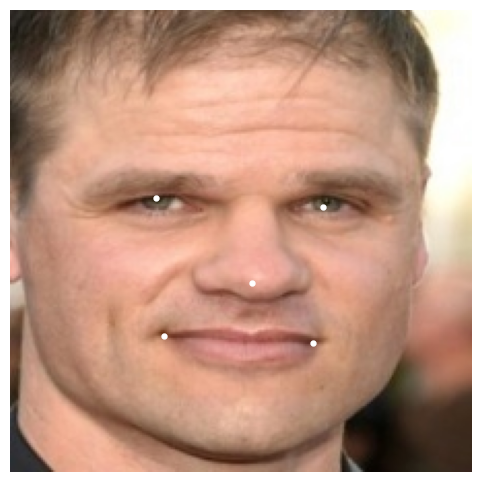

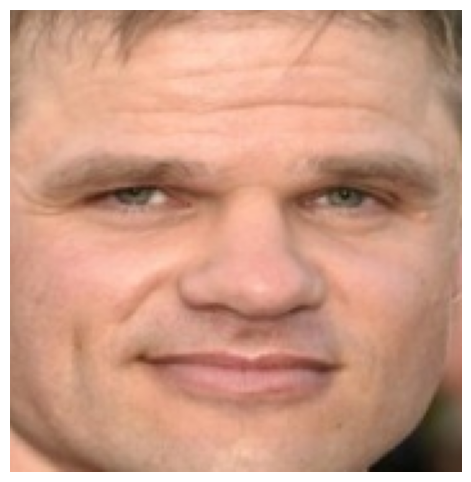

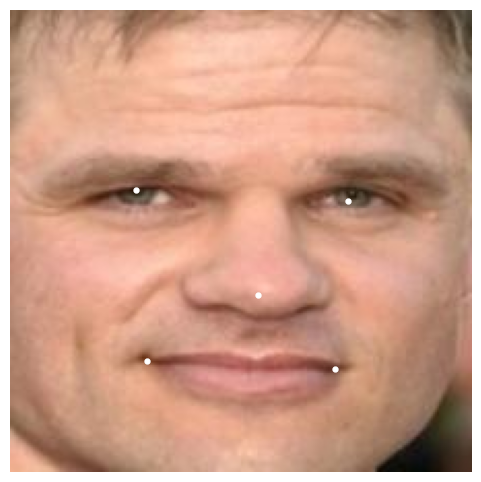

In [549]:
show_points(image_path, '000000', '0.jpg', coords_df)
coords = crop_resize_face(image_path, '000000', '0.jpg', coords_df, project_path, show = True)

img = Image.open(os.path.join(project_path, '0.jpg'))
plt.figure(figsize = (6, 6))
plt.imshow(img)
plt.scatter(coords[::2], coords[1::2], s = 50, marker ='.', c='w')
plt.axis('off');

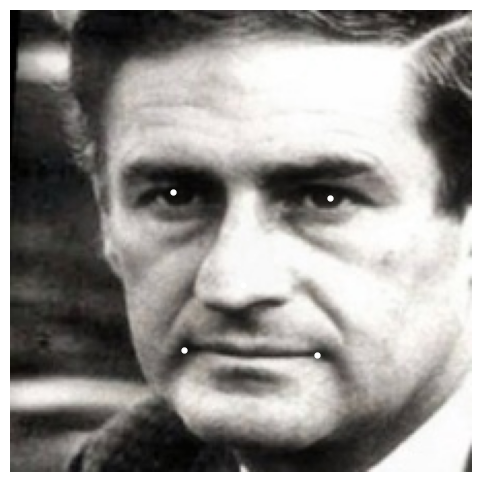

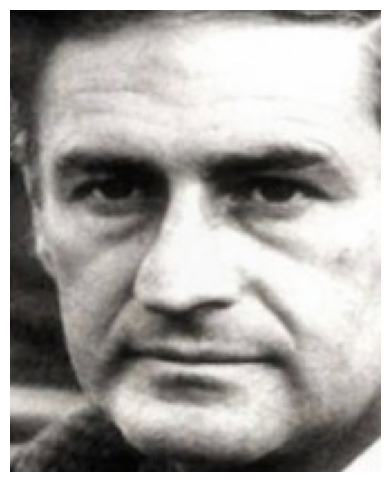

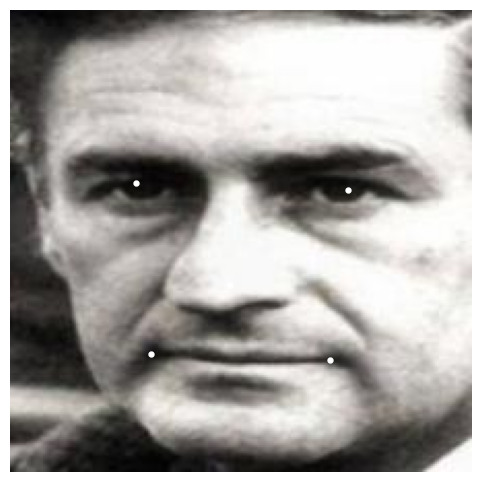

In [551]:
show_points(image_path, '000001', '0.jpg', coords_df)
coords = crop_resize_face(image_path, '000001', '0.jpg', coords_df, project_path, show = True)

img = Image.open(os.path.join(project_path, '0.jpg'))
plt.figure(figsize = (6, 6))
plt.imshow(img)
plt.scatter(coords[::2], coords[1::2], s = 50, marker ='.', c='w')
plt.axis('off');

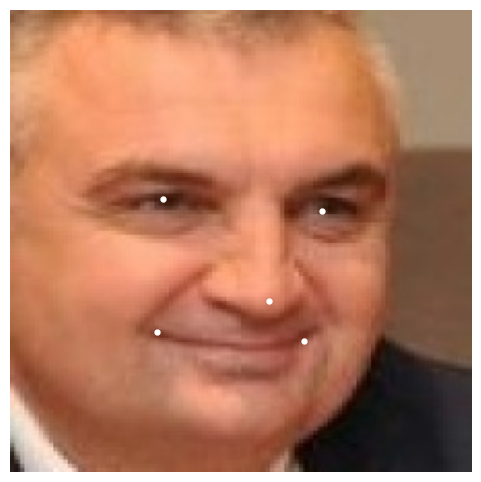

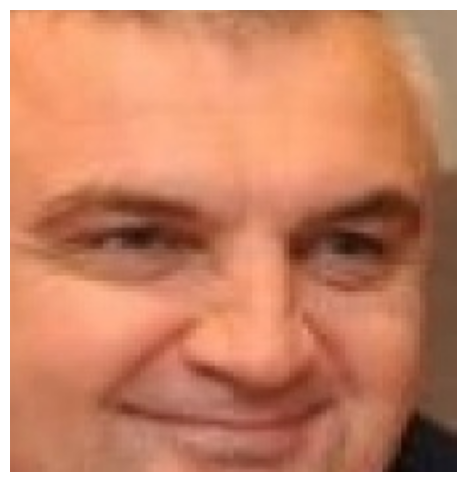

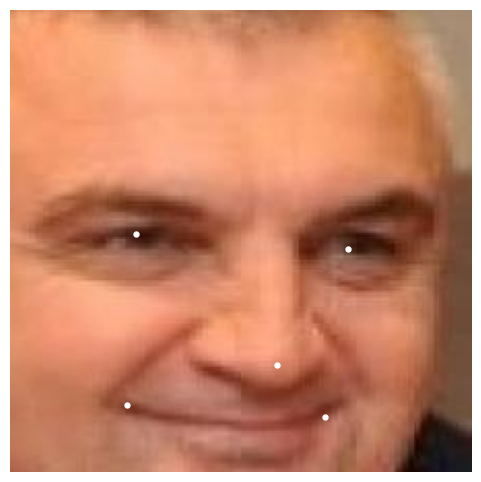

In [553]:
show_points(image_path, '000002', '0.jpg', coords_df)
coords = crop_resize_face(image_path, '000002', '0.jpg', coords_df, project_path, show = True)

img = Image.open(os.path.join(project_path, '0.jpg'))
plt.figure(figsize = (6, 6))
plt.imshow(img)
plt.scatter(coords[::2], coords[1::2], s = 50, marker ='.', c='w')
plt.axis('off');

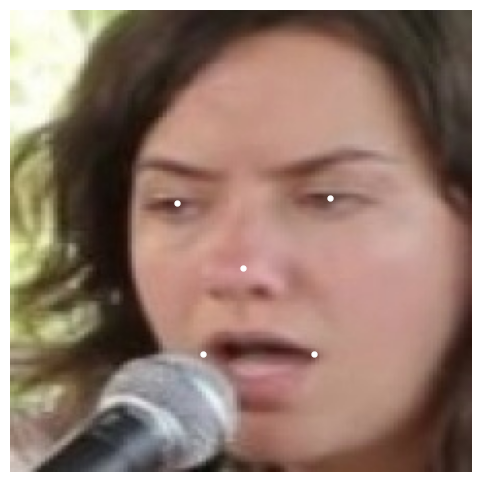

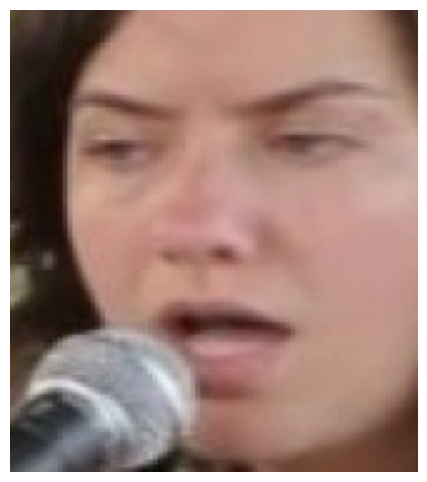

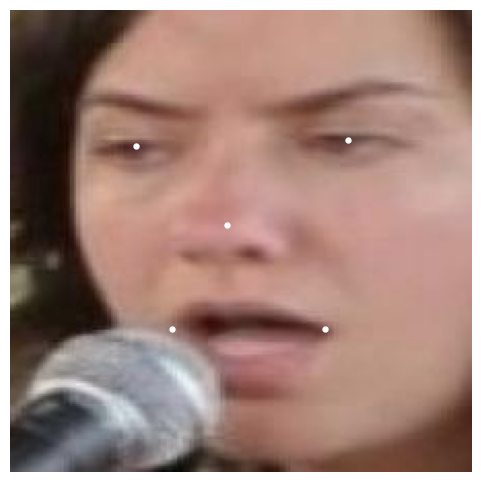

In [555]:
show_points(image_path, '000003', '0.jpg', coords_df)
coords = crop_resize_face(image_path, '000003', '0.jpg', coords_df, project_path, show = True)

img = Image.open(os.path.join(project_path, '0.jpg'))
plt.figure(figsize = (6, 6))
plt.imshow(img)
plt.scatter(coords[::2], coords[1::2], s = 50, marker ='.', c='w')
plt.axis('off');

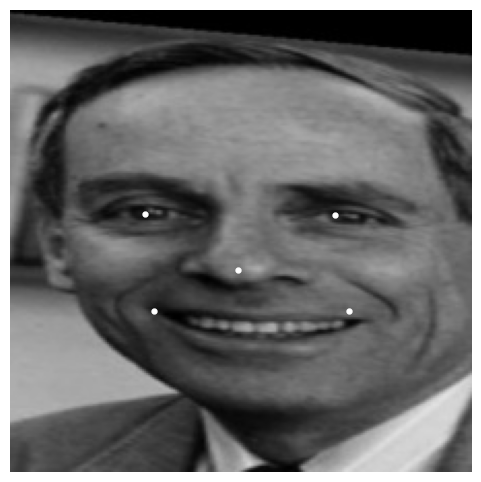

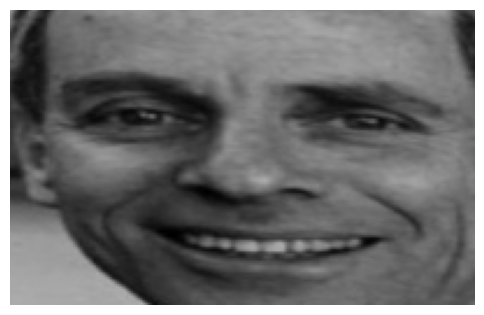

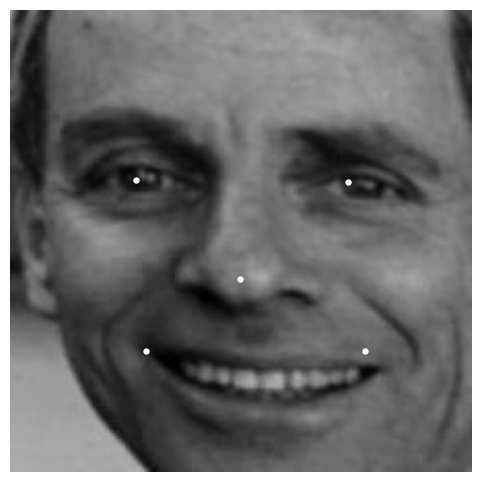

In [559]:
show_points(image_path, '000004', '0.jpg', coords_df)
coords = crop_resize_face(image_path, '000004', '0.jpg', coords_df, project_path, show = True)

img = Image.open(os.path.join(project_path, '0.jpg'))
plt.figure(figsize = (6, 6))
plt.imshow(img)
plt.scatter(coords[::2], coords[1::2], s = 50, marker ='.', c='w')
plt.axis('off');

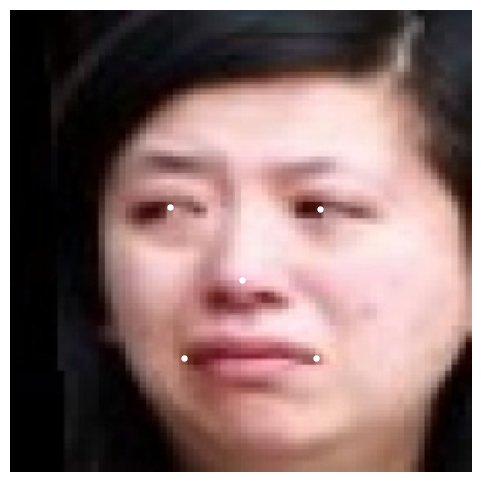

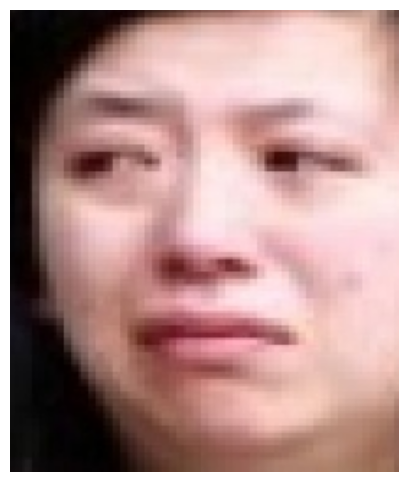

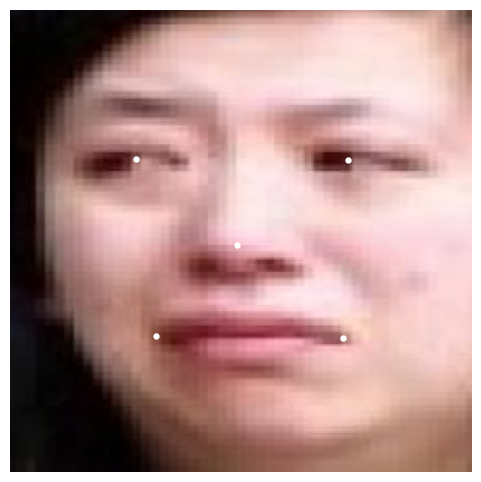

In [561]:
show_points(image_path, '000005', '0.jpg', coords_df)
coords = crop_resize_face(image_path, '000005', '0.jpg', coords_df, project_path, show = True)

img = Image.open(os.path.join(project_path, '0.jpg'))
plt.figure(figsize = (6, 6))
plt.imshow(img)
plt.scatter(coords[::2], coords[1::2], s = 50, marker ='.', c='w')
plt.axis('off');

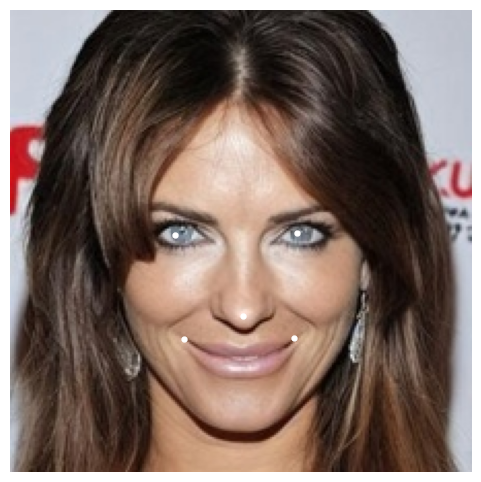

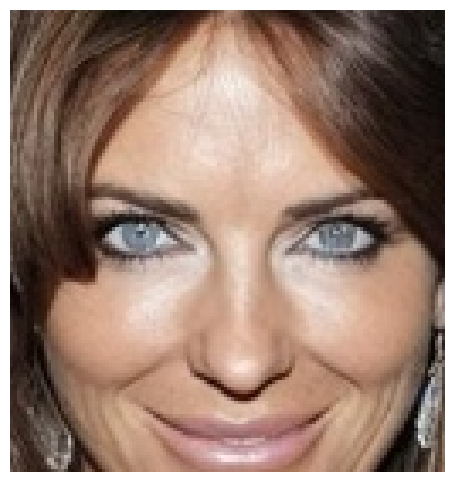

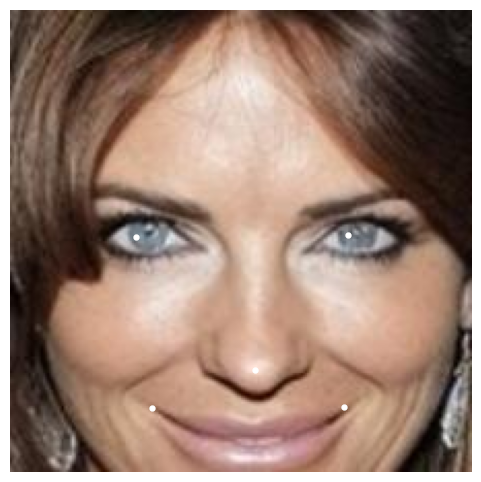

In [563]:
show_points(image_path, '000006', '6.jpg', coords_df)
coords = crop_resize_face(image_path, '000006', '6.jpg', coords_df, project_path, show = True)

img = Image.open(os.path.join(project_path, '6.jpg'))
plt.figure(figsize = (6, 6))
plt.imshow(img)
plt.scatter(coords[::2], coords[1::2], s = 50, marker ='.', c='w')
plt.axis('off');

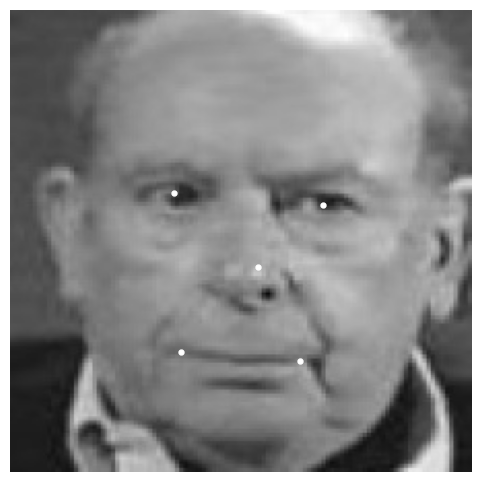

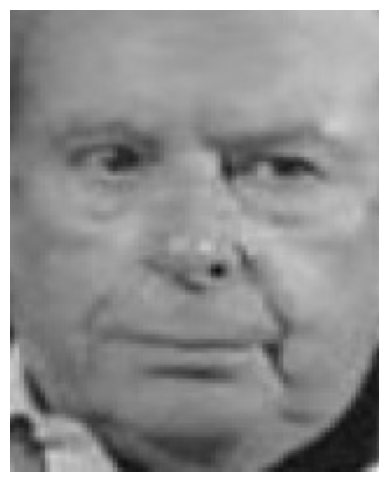

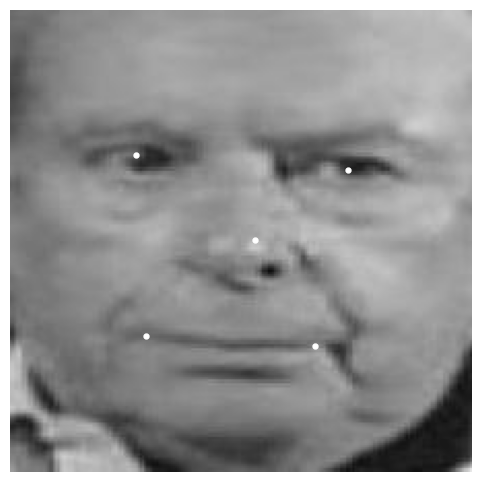

In [565]:
show_points(image_path, '000007', '7.jpg', coords_df)
coords = crop_resize_face(image_path, '000007', '7.jpg', coords_df, project_path, show = True)

img = Image.open(os.path.join(project_path, '7.jpg'))
plt.figure(figsize = (6, 6))
plt.imshow(img)
plt.scatter(coords[::2], coords[1::2], s = 50, marker ='.', c='w')
plt.axis('off');

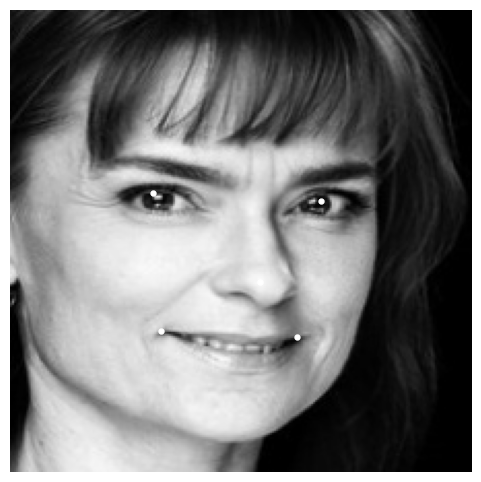

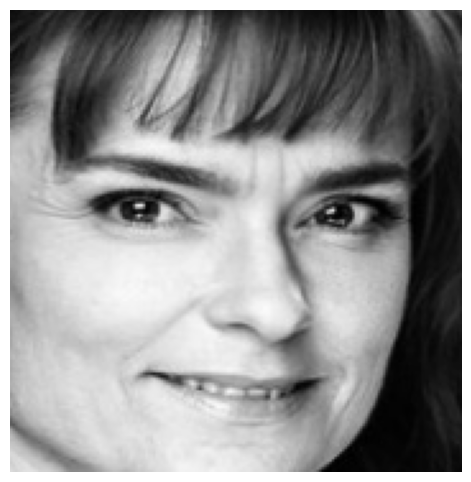

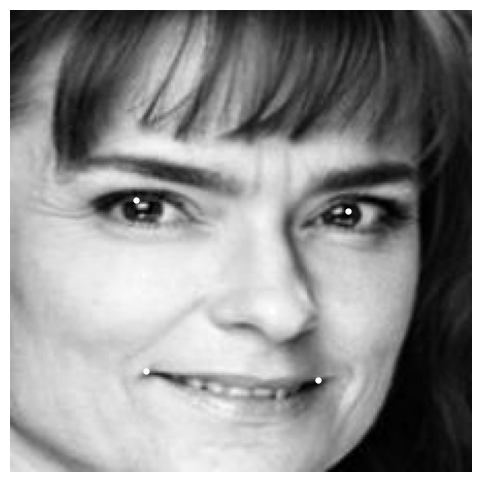

In [567]:
show_points(image_path, '000008', '8.jpg', coords_df)
coords = crop_resize_face(image_path, '000008', '8.jpg', coords_df, project_path, show = True)

img = Image.open(os.path.join(project_path, '8.jpg'))
plt.figure(figsize = (6, 6))
plt.imshow(img)
plt.scatter(coords[::2], coords[1::2], s = 50, marker ='.', c='w')
plt.axis('off');

### More crop

In [650]:
def crop_resize_small_face(path, folder, name, df, output_path, show = False):
    img = Image.open(os.path.join(path, folder, name))
    coord = np.array(df.loc[(df['folder'] == int(folder)) & (df['image'] == name)])[0][2::]
    plt.figure(figsize = (6, 6))
    
    x = coord[0] - (coord[2] - coord[0]) / 2
    y = coord[1] - (coord[5] - coord[1]) * 1.5
    width = ((coord[2] - coord[0]) / 2 + coord[2]) - x
    height = (coord[7] - coord[5]) * 1.5 + coord[7] - y # you may change the height

    if x < 0:
        left = 0
    else:
        left = x

    if y < 0:
        up = 0
    else:
        up = y
 
    if x + width > 224:
        right = 224
    else:
        right = x + width
        
    if y + height > 224:
        bottom = 224
    else:
        bottom = y + height
        
    cropped = img.crop((left, up, right, bottom))

    img_w = right - left
    img_h = bottom - up
    
    mltplr_w = 224 / img_w # коэффициент ширины
    mltplr_h = 224 / img_h # коэффициент высоты

    x_coord = [(c - x) * mltplr_w for c in coord[0::2]]
    y_coord = [(c - y) * mltplr_h for c in coord[1::2]]

    resize = cropped.resize((224, 224))

    resize.save(os.path.join(output_path, name))
    coords_new = [x_coord[0], y_coord[0], x_coord[1], y_coord[1], x_coord[2], y_coord[2], x_coord[3], y_coord[3], x_coord[4], y_coord[4]]

    if show == True:
        plt.imshow(cropped)
        plt.axis('off');

    plt.close()

    return coords_new

##### Check

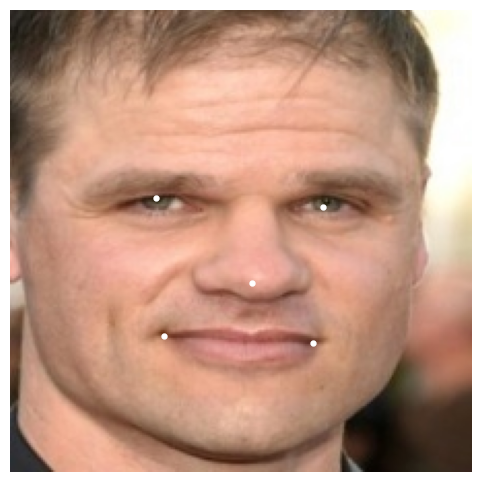

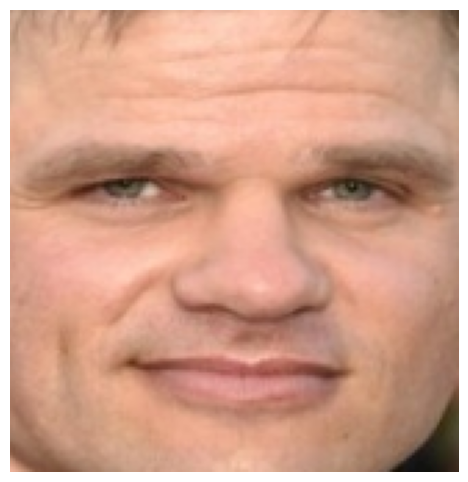

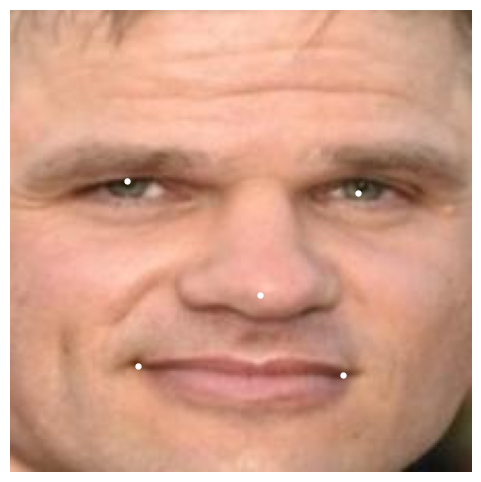

In [609]:
show_points(image_path, '000000', '0.jpg', coords_df)
coords = crop_resize_small_face(image_path, '000000', '0.jpg', coords_df, project_path, show = True)

img = Image.open(os.path.join(project_path, '0.jpg'))
plt.figure(figsize = (6, 6))
plt.imshow(img)
plt.scatter(coords[::2], coords[1::2], s = 50, marker ='.', c='w')
plt.axis('off');

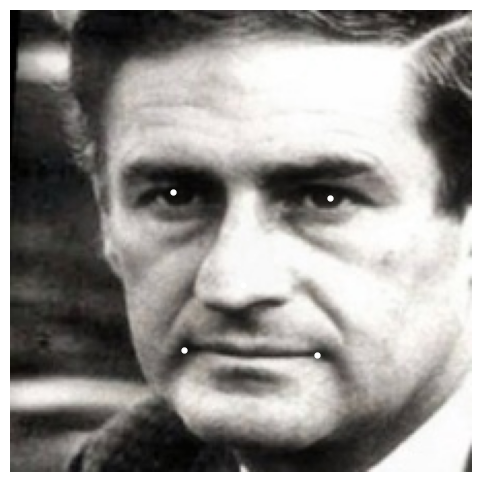

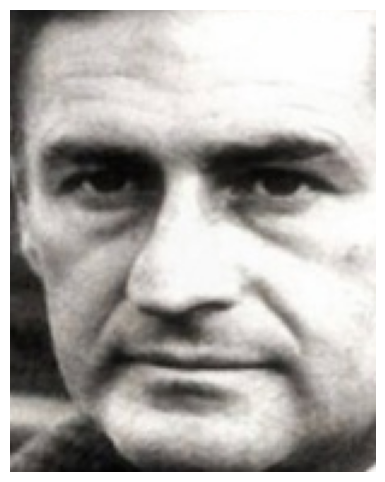

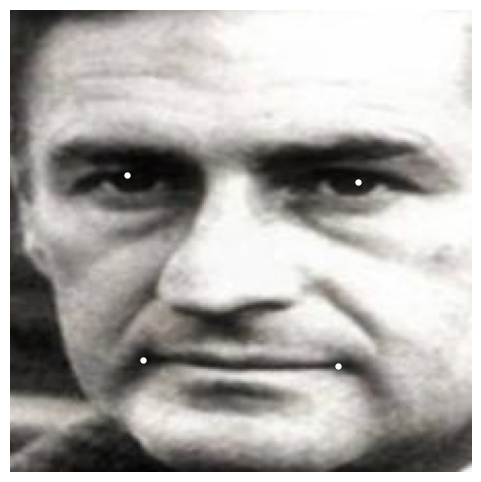

In [612]:
show_points(image_path, '000001', '0.jpg', coords_df)
coords = crop_resize_small_face(image_path, '000001', '0.jpg', coords_df, project_path, show = True)

img = Image.open(os.path.join(project_path, '0.jpg'))
plt.figure(figsize = (6, 6))
plt.imshow(img)
plt.scatter(coords[::2], coords[1::2], s = 50, marker ='.', c='w')
plt.axis('off');

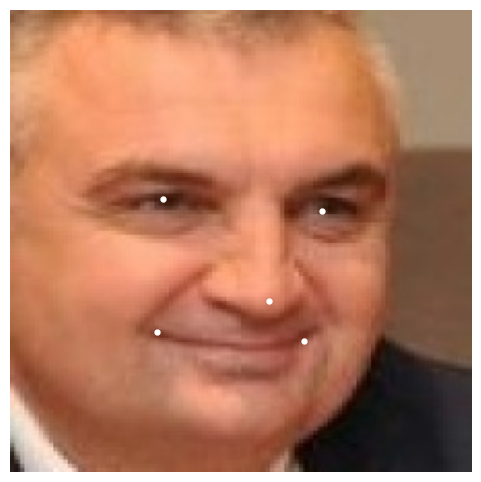

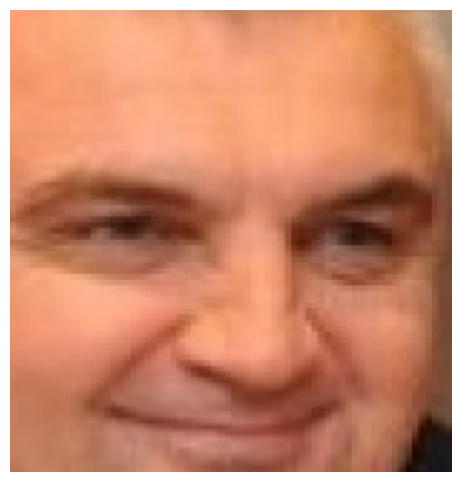

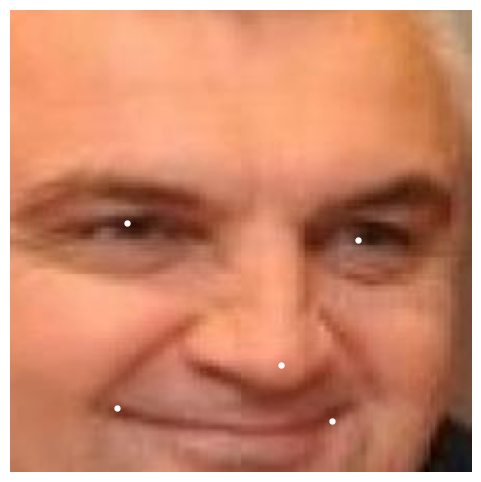

In [619]:
show_points(image_path, '000002', '0.jpg', coords_df)
coords = crop_resize_small_face(image_path, '000002', '0.jpg', coords_df, project_path, show = True)

img = Image.open(os.path.join(project_path, '0.jpg'))
plt.figure(figsize = (6, 6))
plt.imshow(img)
plt.scatter(coords[::2], coords[1::2], s = 50, marker ='.', c='w')
plt.axis('off');

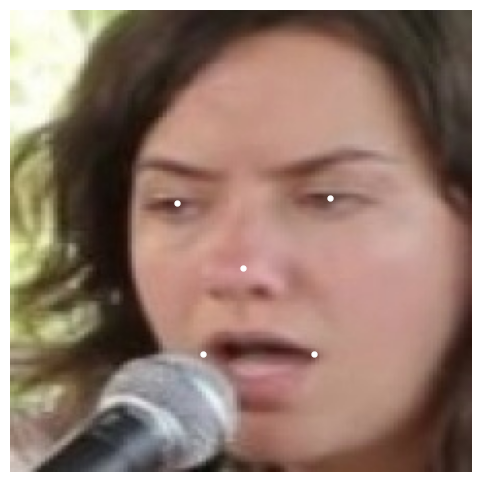

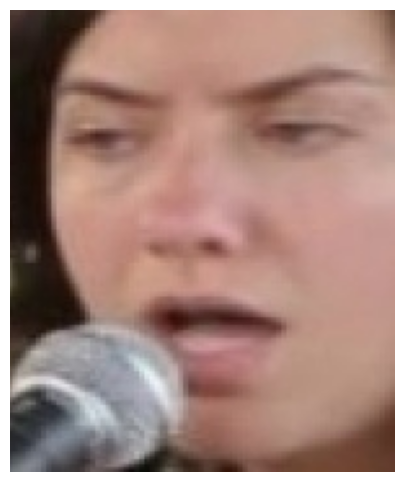

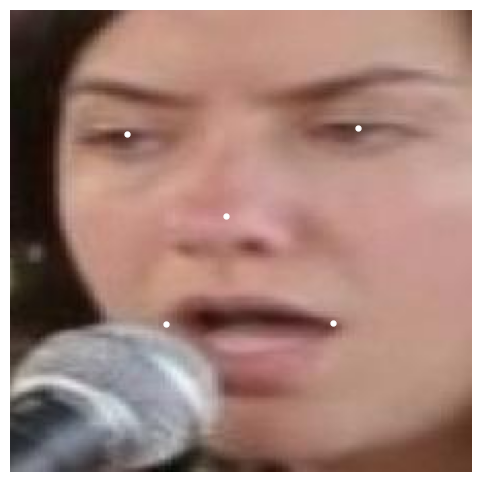

In [621]:
show_points(image_path, '000003', '0.jpg', coords_df)
coords = crop_resize_small_face(image_path, '000003', '0.jpg', coords_df, project_path, show = True)

img = Image.open(os.path.join(project_path, '0.jpg'))
plt.figure(figsize = (6, 6))
plt.imshow(img)
plt.scatter(coords[::2], coords[1::2], s = 50, marker ='.', c='w')
plt.axis('off');

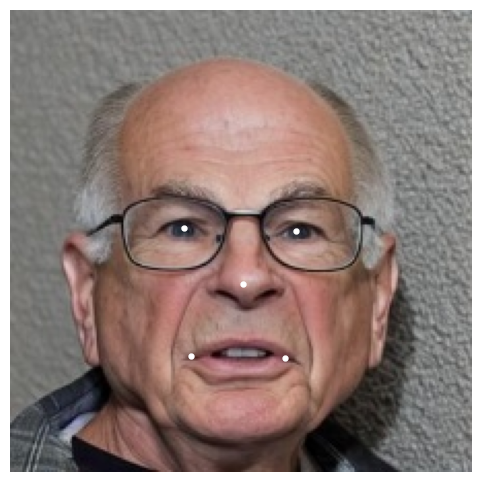

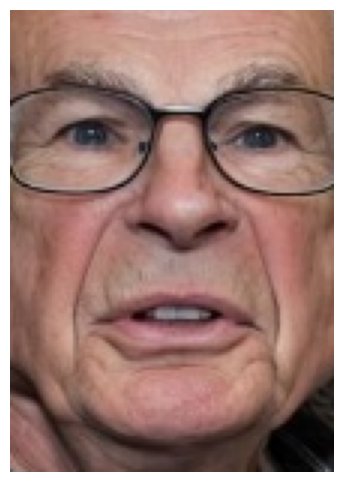

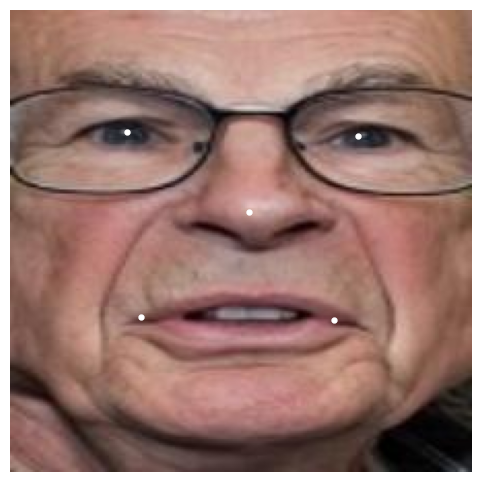

In [623]:
show_points(image_path, '000004', '4.jpg', coords_df)
coords = crop_resize_small_face(image_path, '000004', '4.jpg', coords_df, project_path, show = True)

img = Image.open(os.path.join(project_path, '4.jpg'))
plt.figure(figsize = (6, 6))
plt.imshow(img)
plt.scatter(coords[::2], coords[1::2], s = 50, marker ='.', c='w')
plt.axis('off');

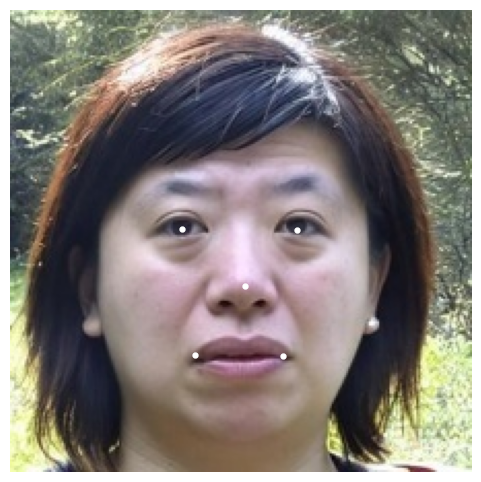

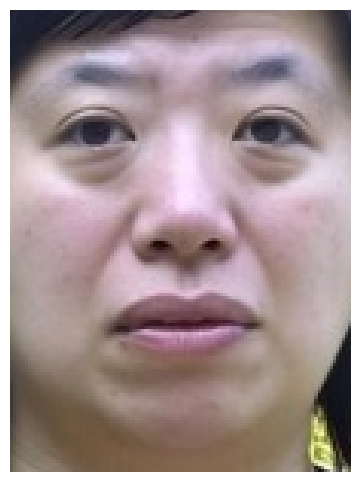

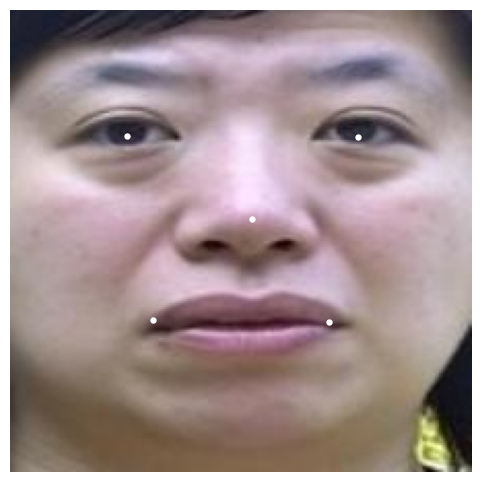

In [625]:
show_points(image_path, '000005', '5.jpg', coords_df)
coords = crop_resize_small_face(image_path, '000005', '5.jpg', coords_df, project_path, show = True)

img = Image.open(os.path.join(project_path, '5.jpg'))
plt.figure(figsize = (6, 6))
plt.imshow(img)
plt.scatter(coords[::2], coords[1::2], s = 50, marker ='.', c='w')
plt.axis('off');

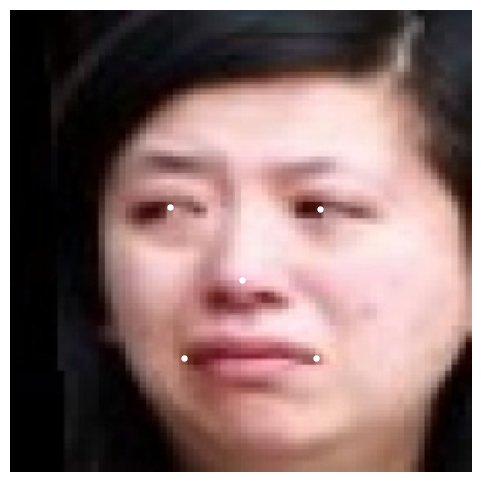

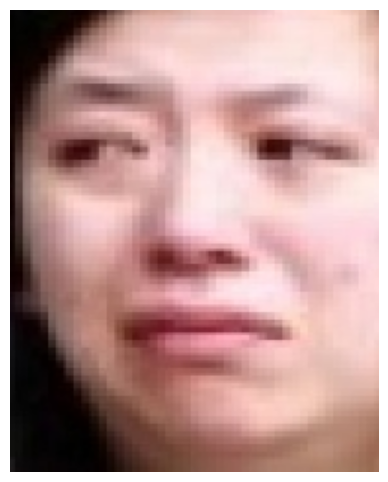

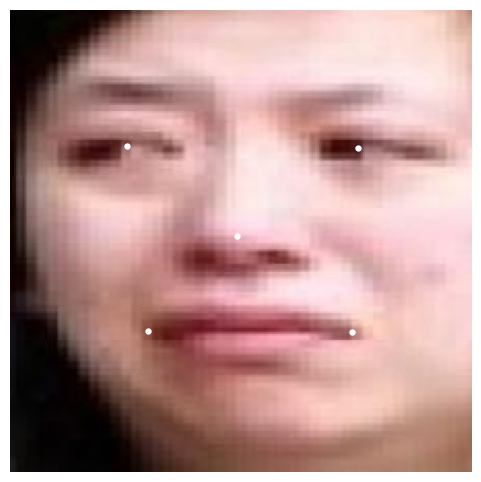

In [629]:
show_points(image_path, '000005', '0.jpg', coords_df)
coords = crop_resize_small_face(image_path, '000005', '0.jpg', coords_df, project_path, show = True)

img = Image.open(os.path.join(project_path, '0.jpg'))
plt.figure(figsize = (6, 6))
plt.imshow(img)
plt.scatter(coords[::2], coords[1::2], s = 50, marker ='.', c='w')
plt.axis('off');

### Make new cropped dataset

In [638]:
image_path = r'F:\Codenrock\Kryptonite\data\train\images'
train_folders = os.listdir(image_path)
output_path = r'F:\Codenrock\Kryptonite\cropped'

In [652]:
coords_cropped = []

for folder in train_folders:
    for image in os.listdir(os.path.join(image_path, folder)):
        if not os.path.exists(os.path.join(output_path, folder)):
            os.makedirs(os.path.join(output_path, folder))
        coords = crop_resize_small_face(image_path, folder, image, coords_df, os.path.join(output_path, folder), show = False)        
        coords_cropped.append([folder, image, coords[0], coords[1], coords[2], coords[3], coords[4], coords[5], coords[6], coords[7], coords[8], coords[9]])

In [646]:
for image in os.listdir(train_folders[0]):
    print(image)

0.jpg
1.jpg
2.jpg
3.jpg
4.jpg
5.jpg
6.jpg
7.jpg
8.jpg


In [ ]:
crop_resize_small_face(path, folder, name, df, output_path, show = False):